## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

Use funtinon:
1. find_chessboard_corner: Find out the cheessboard corners and use chessboard images to obtain image points and object points

In [1]:
import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

In [3]:
def find_chessboard_corner(img):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)

        # this step to refine image points was taken from:
        # http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html
#         corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
#         imgpoints.append(corners2)
#         img = cv2.drawChessboardCorners(img, (9,6), corners2, ret)

        imgpoints.append(corners)
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
#         print("ok")
        return img
    else:
#         print("null")
        return None


### Run find_chessboard_corner on calibration images (path: ../camera_cal/):

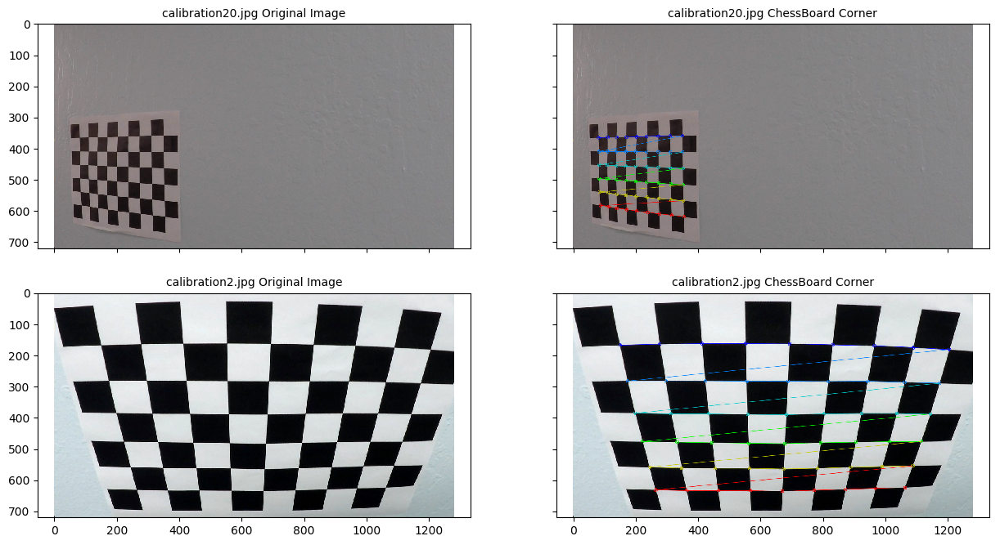

In [4]:

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration2*.jpg')

row = 2
column = 2
fig, axs = plt.subplots(row, column, figsize=(15,8), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    name = fname.replace("../camera_cal/", "")
    
    axs[i, 0].imshow(img)
    axs[i, 0].set_title('%s Original Image' % name, fontsize=10)

    img = find_chessboard_corner(img)
    if img != None :
        axs[i, 1].imshow(img)
        axs[i, 1].set_title('%s ChessBoard Corner' % name, fontsize=10)

    else:
        npArray = np.array([[[255, 255, 255, 0]]], dtype='uint8')
        axs[i, 1].imshow(npArray, interpolation='nearest')
        axs[i, 1].set_title('%s ChessBoard Corner' % name, fontsize=10)
        
fig.savefig('../test_images_output/find_chessboard_corner.png')

## Next, I'll corret the image distortion

Funtinon:
1. calibrate_undistort: Use the OpenCV functions cv2.calibrateCamera() and cv2.undistort() to compute the calibration and undistortion.

In [5]:
def calibrate_undistort(img):
    # Use cv2.calibrateCamera() and cv2.undistort()
    # undist = np.copy(img)  # Delete this line
    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    
    return dst

### Run calibrate_undistort  on test images (path: ../test_images/):

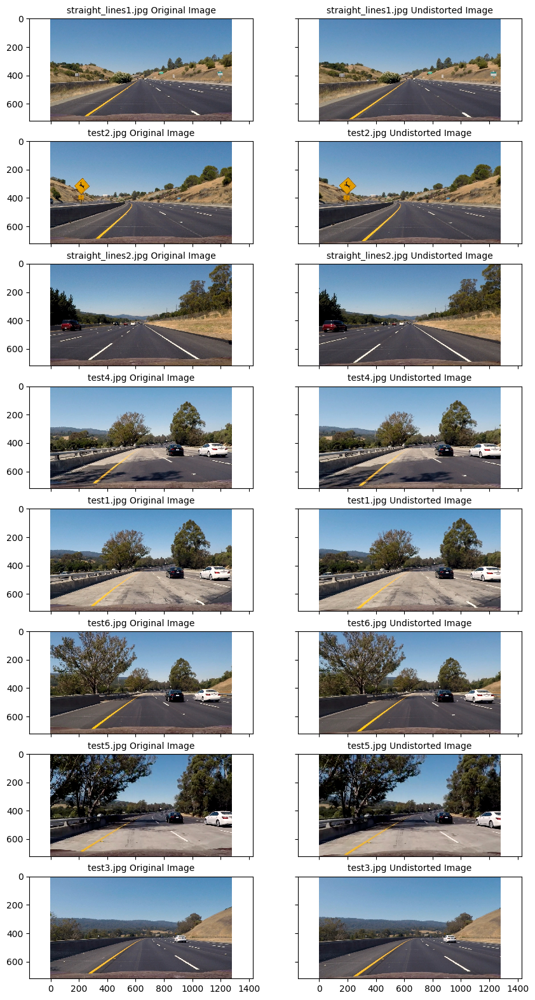

In [6]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    axs[i, 0].imshow(img)
    axs[i, 0].set_title('%s Original Image' % name, fontsize=10)

    img = calibrate_undistort(img)
    
    axs[i, 1].imshow(img)
    axs[i, 1].set_title('%s Undistorted Image' % name, fontsize=10)
    
fig.savefig('../test_images_output/calibrate_undistort.png')

## Next, I'll apply a perspective transform

Funtinon:
1. unwarp: To transofrm an image to bird’s-eye view that let’s us view a lane from above
  * Define 4 source points 
  * Define 4 destination points 
  * Use cv2.getPerspectiveTransform() to get M, the transform matrix
  * use cv2.warpPerspective() to apply M and warp your image to a top-down view

In [7]:
def unwarp(img):
    img_size = (img.shape[1], img.shape[0])
#     print(img_size[0])
#     print(img_size[1])
    
    # define source and destination points for transform
    src = np.float32([(575,464),
                      (707,464), 
                      (258,682), 
                      (1049,682)])
    dst = np.float32([(450,0),
                      (img_size[0]-450,0),
                      (450,img_size[1]),
                      (img_size[0]-450,img_size[1])])
#     print (src)
#     print (dst)
    
    M = cv2.getPerspectiveTransform(src, dst)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

    return warped

### Run unwarp on test images (path: ../test_images/):

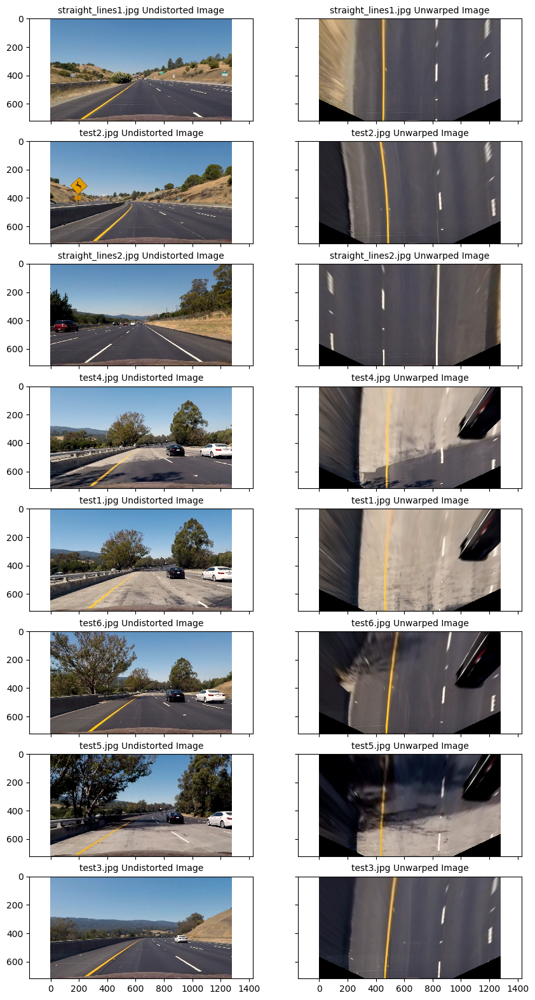

In [8]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    
    axs[i, 0].imshow(img)
    axs[i, 0].set_title('%s Undistorted Image' % name, fontsize=10)
    
    img = unwarp(img)
    axs[i, 1].imshow(img)
    axs[i, 1].set_title('%s Unwarped Image' % name, fontsize=10)

fig.savefig('../test_images_output/unwarp.png')

## Next, I'll test on different color space channels (RGB, HLS, LAB)


### 1. Display RGB color on test images (path: ../test_images/):

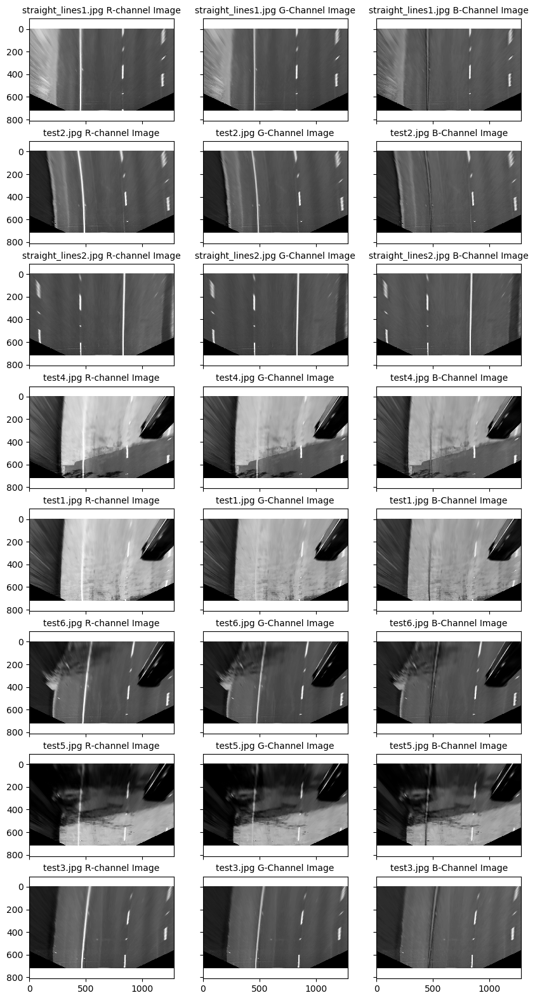

In [9]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 3
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    img = unwarp(img)
    img_R = img[:,:,0]
    img_G = img[:,:,1]
    img_B = img[:,:,2]
    
    axs[i, 0].imshow(img_R, cmap='gray')
    axs[i, 0].set_title('%s R-channel Image' % name, fontsize=10)
    
    axs[i, 1].imshow(img_G, cmap='gray')
    axs[i, 1].set_title('%s G-Channel Image' % name, fontsize=10)
    
    axs[i, 2].imshow(img_B, cmap='gray')
    axs[i, 2].set_title('%s B-Channel Image' % name, fontsize=10)

fig.savefig('../test_images_output/color-rgb.png')

### 2. Display HSV color on test images (path: ../test_images/):

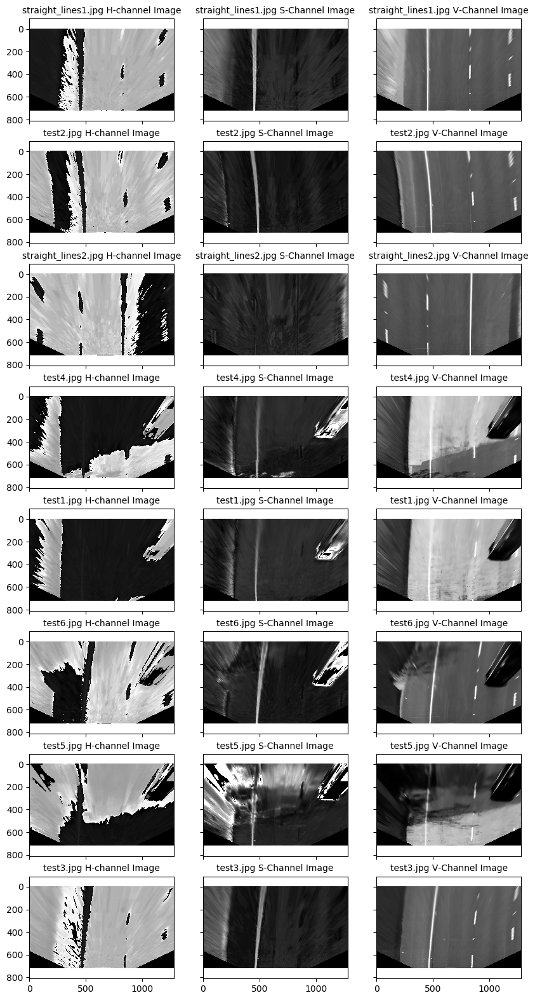

In [10]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 3
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    img = unwarp(img)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_H = img[:,:,0]
    img_S = img[:,:,1]
    img_V = img[:,:,2]
    
    axs[i, 0].imshow(img_H, cmap='gray')
    axs[i, 0].set_title('%s H-channel Image' % name, fontsize=10)
    
    axs[i, 1].imshow(img_S, cmap='gray')
    axs[i, 1].set_title('%s S-Channel Image' % name, fontsize=10)
    
    axs[i, 2].imshow(img_V, cmap='gray')
    axs[i, 2].set_title('%s V-Channel Image' % name, fontsize=10)

    fig.savefig('../test_images_output/color-hsv.png')

### 3. Display LAB color on test images (path: ../test_images/):

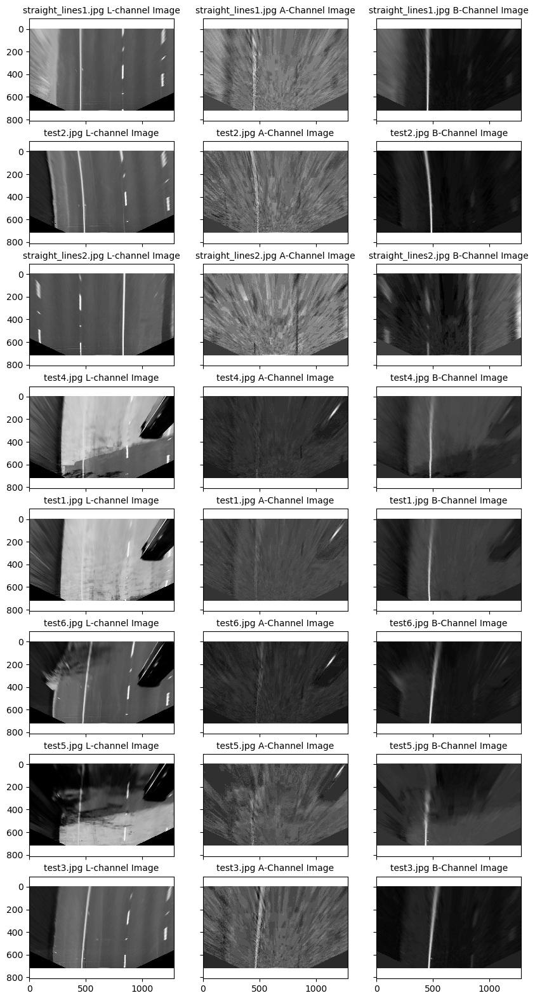

In [11]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 3
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    img = unwarp(img)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    img_L = img[:,:,0]
    img_A = img[:,:,1]
    img_B = img[:,:,2]
    
    axs[i, 0].imshow(img_L, cmap='gray')
    axs[i, 0].set_title('%s L-channel Image' % name, fontsize=10)
    
    axs[i, 1].imshow(img_A, cmap='gray')
    axs[i, 1].set_title('%s A-Channel Image' % name, fontsize=10)
    
    axs[i, 2].imshow(img_B, cmap='gray')
    axs[i, 2].set_title('%s B-Channel Image' % name, fontsize=10)
    
fig.savefig('../test_images_output/color-lab.png')

## Next, I'll test a sobel absolute threshold

Funtinon:
1. abs_sobel_thresh: To take an absolute value and applies a threshold for Sobel x or y
  * Convert to grayscale
  * Take the derivative in x or y given orient = 'x' or 'y'
  * Take the absolute value of the derivative or gradient
  * Scale to 8-bit (0 - 255) then convert to type = np.uint8
  * Create a mask of 1's where the scaled gradient magnitude, # is > thresh_min and < thresh_max
  * Return this mask as your binary_output image

In [12]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

### Run abs_sobel_thresh on test images (path: ../test_images/):

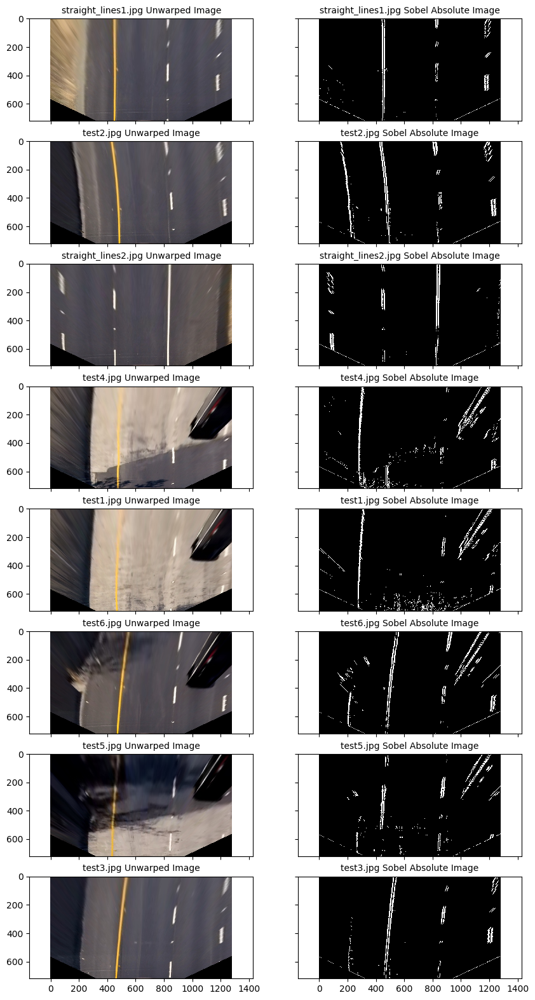

In [13]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Unwarped Image' % name, fontsize=10)
    
    img = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    axs[i, 1].imshow(img, cmap='gray')
    axs[i, 1].set_title('%s Sobel Absolute Image' % name, fontsize=10)

fig.savefig('../test_images_output/abs_sobel_thresh.png')

## Next, I'll test a sobel magnitude threshold

Funtinon:
1. mag_thresh: To compute the magnitude of the gradient and applies a threshold for Sobel x or y
  * Convert to grayscale
  * Take the derivative in x or y given orient = 'x' or 'y'
  * Calculate the magnitude 
  * Scale to 8-bit (0 - 255) then convert to type = np.uint8
  * Create a mask of 1's where the scaled gradient magnitude, # is > thresh_min and < thresh_max
  * Return this mask as your binary_output image

In [14]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

### Run mag_thresh on test images (path: ../test_images/):

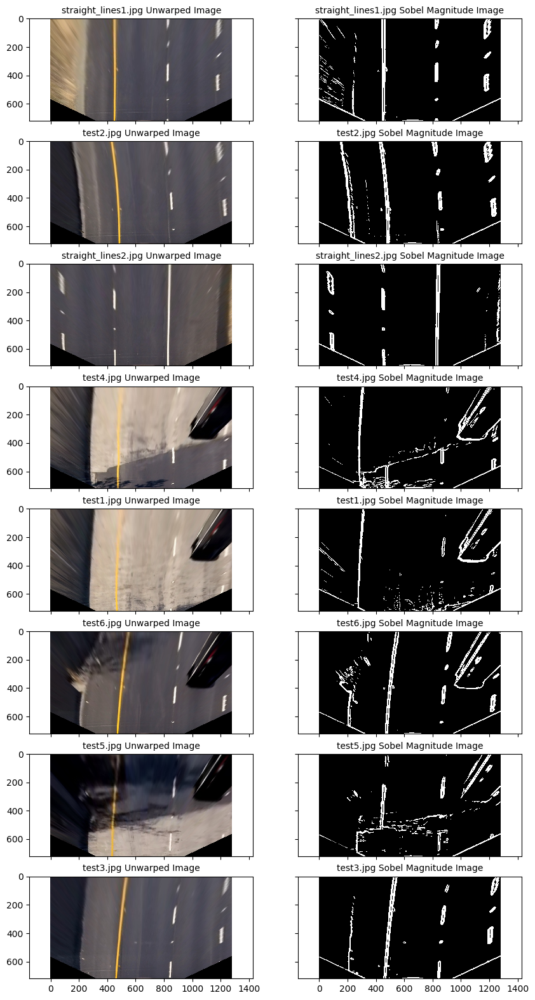

In [15]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Unwarped Image' % name, fontsize=10)
    
    img = mag_thresh(img, sobel_kernel=25, mag_thresh=(25, 255))
#     img = mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100))
    axs[i, 1].imshow(img, cmap='gray')
    axs[i, 1].set_title('%s Sobel Magnitude Image' % name, fontsize=10)
    
fig.savefig('../test_images_output/mag_thresh.png')

## Next, I'll test a sobel direction threshold

Funtinon:
1. dir_threshold: To compute the direction of the gradient and applies a threshold for Sobel x or y
  * Convert to grayscale
  * Take the derivative in x or y given orient = 'x' or 'y'
  * Take the absolute value of the derivative or gradient
  * Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
  * Create a binary mask where direction thresholds are met
  * Return this mask as your binary_output image

In [16]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

### Run dir_threshold on test images (path: ../test_images/):

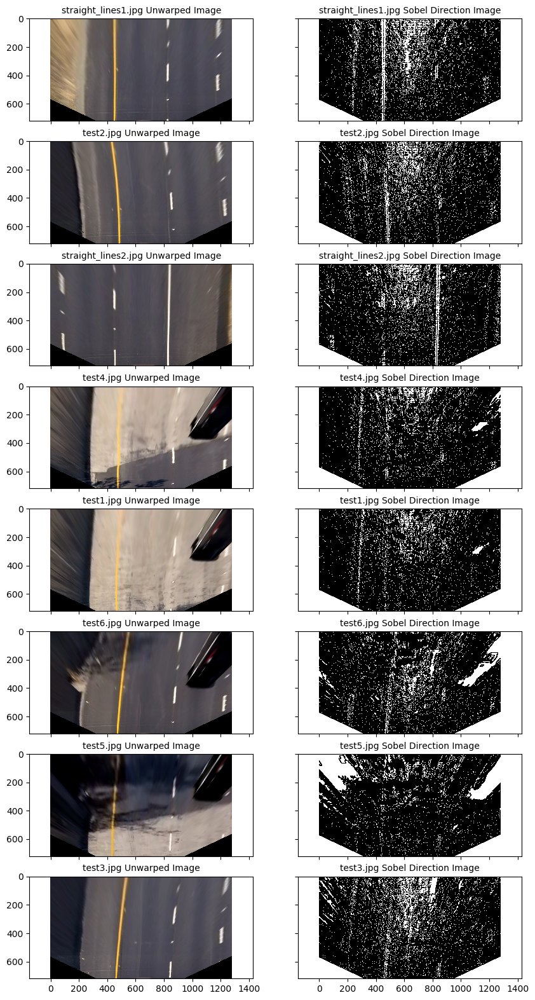

In [17]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Unwarped Image' % name, fontsize=10)
    
    img = dir_threshold(img, sobel_kernel=7, thresh=(0, 0.09))
#     img = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
    axs[i, 1].imshow(img, cmap='gray')
    axs[i, 1].set_title('%s Sobel Direction Image' % name, fontsize=10)
    
fig.savefig('../test_images_output/dir_threshold.png')

### Run mag_thresh and dir_threshold on test images (path: ../test_images/):

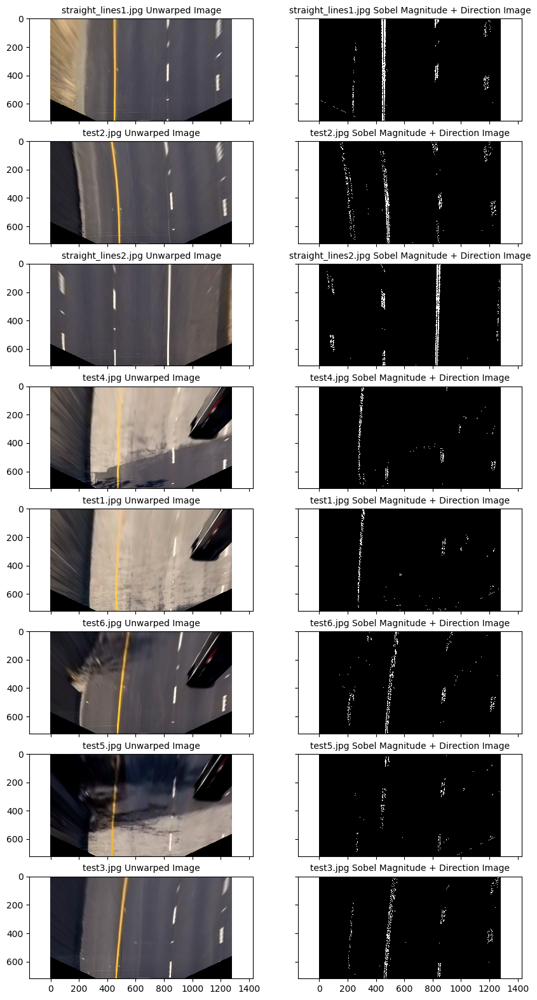

In [18]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Unwarped Image' % name, fontsize=10)
    
    img_mag_thresh = mag_thresh(img, sobel_kernel=25, mag_thresh=(25, 255))
    img_dir_threshold = dir_threshold(img, sobel_kernel=7, thresh=(0, 0.09))
    
#     img_mag_thresh = mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100))
#     img_dir_threshold = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
    
    combined = np.zeros_like(img_mag_thresh)
    combined[((img_mag_thresh == 1) & (img_dir_threshold == 1))] = 1
    
    axs[i, 1].imshow(combined, cmap='gray')
    axs[i, 1].set_title('%s Sobel Magnitude + Direction Image' % name, fontsize=10)
    
fig.savefig('../test_images_output/mag_thresh_and_dir_threshold.png')

## Next, I'll test a HLS S-Channel threshold

Funtinon:
1. hls_sthresh: To threshold the S-channel of HLS
  * Convert to HLS color space
  * Apply a threshold to the S channel
  * Return a binary image of threshold result

In [19]:
def hls_sthresh(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(hls[:,:,2])
    binary_output[(hls[:,:,2] > thresh[0]) & (hls[:,:,2] <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

### Run hls_sthresh on test images (path: ../test_images/):

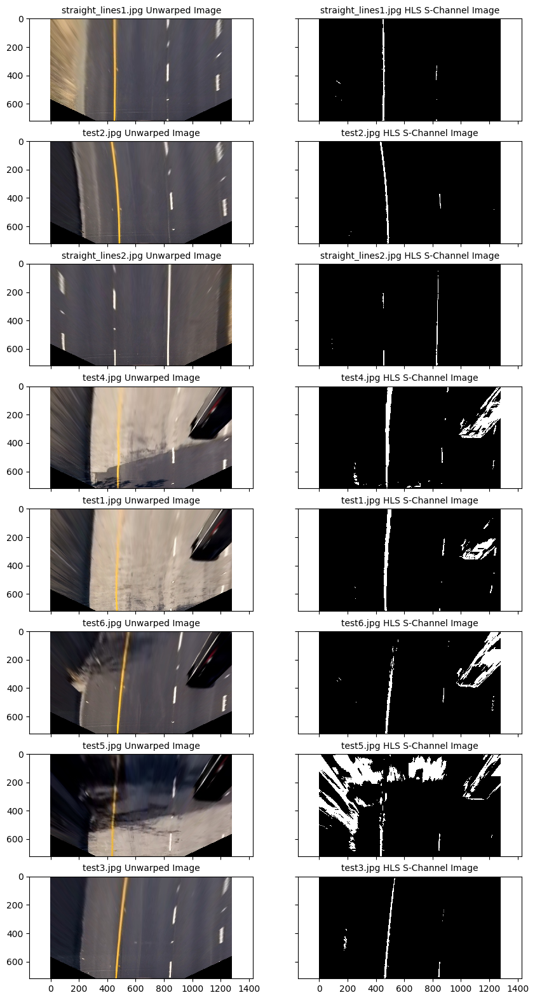

In [20]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Unwarped Image' % name, fontsize=10)
    
    img = hls_sthresh(img, thresh=(125, 255))
    
    axs[i, 1].imshow(img, cmap='gray')
    axs[i, 1].set_title('%s HLS S-Channel Image' % name, fontsize=10)
    
fig.savefig('../test_images_output/hls_sthresh.png')

## Next, I'll test a HLS L-Channel threshold

Funtinon:
1. hls_lthresh: To threshold the L-channel of HLS
  * Convert to HLS color space
  * Apply a threshold to the L channel
  * Return a binary image of threshold result

In [21]:
def hls_lthresh(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

### Run hls_lthresh on test images (path: ../test_images/):

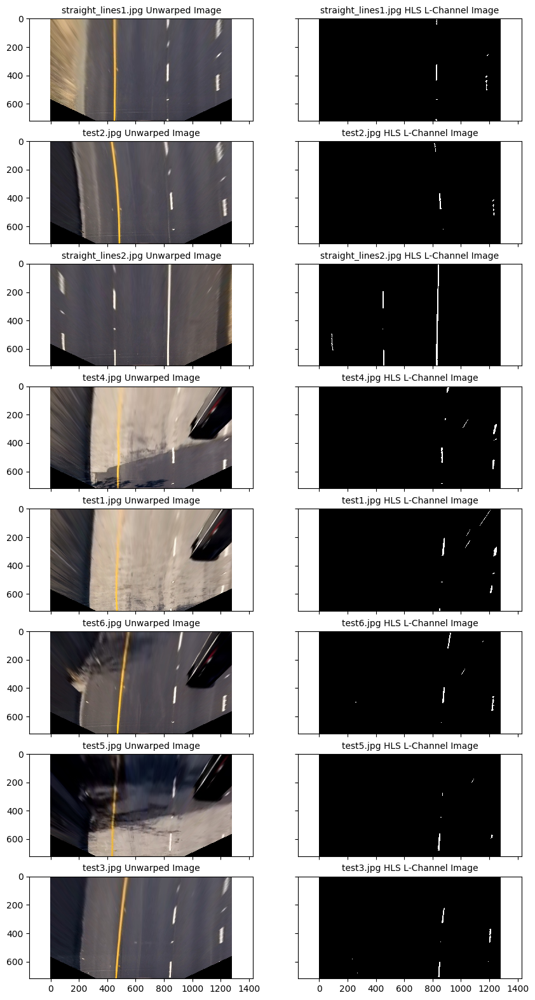

In [22]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Unwarped Image' % name, fontsize=10)
    
    img = hls_lthresh(img, thresh=(220, 255))
    
    axs[i, 1].imshow(img, cmap='gray')
    axs[i, 1].set_title('%s HLS L-Channel Image' % name, fontsize=10)
    
fig.savefig('../test_images_output/hls_lthresh.png')

## Next, I'll test a LAB B-Channel threshold

Funtinon:
1. lab_bthresh: To threshold the B-channel of LAB
  * Convert to LAB color space
  * Apply a threshold to the B channel
  * Return a binary image of threshold result

In [23]:
def lab_bthresh(img, thresh=(0, 255)):
    # 1) Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    # don't normalize if there are no yellows in the image
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    # 2) Apply a threshold to the B channel
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    # 3) Return a binary image of threshold result
    return binary_output

### Run lab_bthresh on test images (path: ../test_images/):

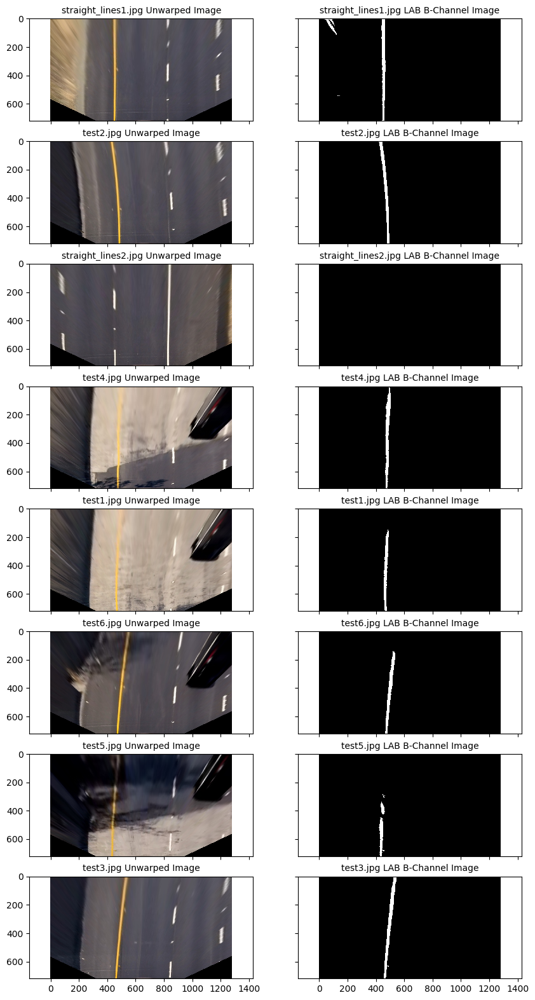

In [24]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    img = calibrate_undistort(img)
    img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Unwarped Image' % name, fontsize=10)
    
    img = lab_bthresh(img, thresh=(190,255))
    
    axs[i, 1].imshow(img, cmap='gray')
    axs[i, 1].set_title('%s LAB B-Channel Image' % name, fontsize=10)
    
fig.savefig('../test_images_output/lab_bthresh.png')

## Next, I'll creat a image processing pipeline

Funtinon:
1. pipeline: To combine all processing function above, reads raw image and returns binary image with lane lines identified
  * Undistort
  * Perspective Transform
  * (Sobel Absolute)
  * (Sobel Magnitude)
  * (Sobel Direction)
  * (HLS S-channel Threshold)
  * HLS L-channel Threshold
  * LAB B-channel Threshold

In [25]:
def pipeline(img):
    # Undistort
    img_undistort = calibrate_undistort(img)
    
    # Perspective Transform
    img_unwarp = unwarp(img_undistort)

    # Sobel Absolute
    #img_sobelAbs = abs_sobel_thresh(img_undistort, orient='x', thresh_min=20, thresh_max=100)

    # Sobel Magnitude 
    #img_sobelMag = mag_thresh(img_undistort, sobel_kernel=25, mag_thresh=(25, 255))
    
    # Sobel Direction
    #img_sobelDir = dir_threshold(img_undistort, sobel_kernel=7, thresh=(0, 0.09))
    
    # HLS S-channel Threshold
    #img_SThresh = hls_sthresh(img_unwarp, thresh=(125, 255))

    # HLS L-channel Threshold
    img_LThresh = hls_lthresh(img_unwarp, thresh=(220, 255))

    # Lab B-channel Threshold
    img_BThresh = lab_bthresh(img_unwarp, thresh=(190,255))
    
    # Combine HLS L-channel and LAB B-channel channel thresholds
    combined = np.zeros_like(img_BThresh)
    combined[(img_LThresh == 1) | (img_BThresh == 1)] = 1
    
    # Combine All
#     combined[(img_sobelAbs == 1) | (img_sobelMag == 1) | (img_sobelDir == 1) | (img_SThresh == 1) | (img_LThresh == 1) | (img_BThresh == 1)] = 1
    
    return combined

### Run pipeline on test images (path: ../test_images/):

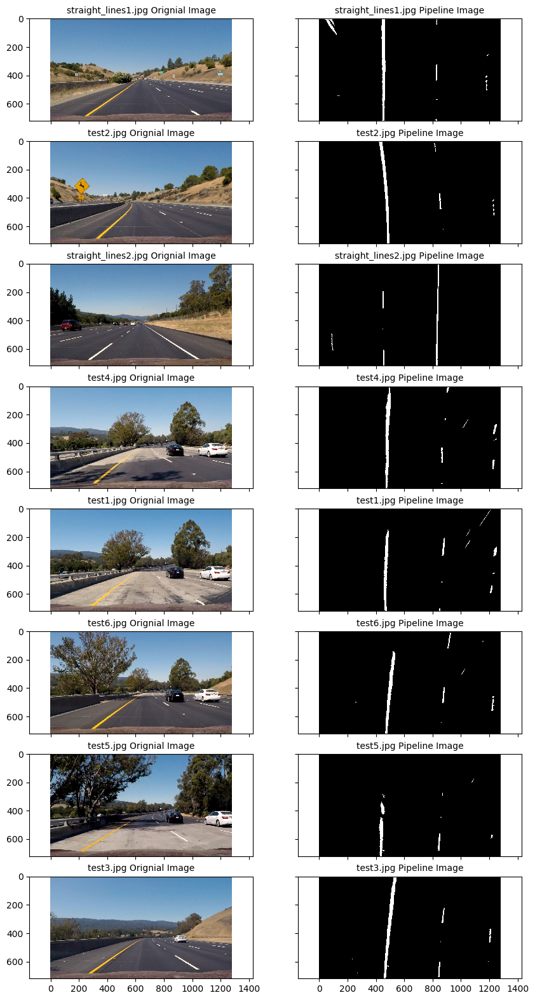

In [26]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
#     img = calibrate_undistort(img)
#     img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Orignial Image' % name, fontsize=10)
    
    img = pipeline(img)
    
    axs[i, 1].imshow(img, cmap='gray')
    axs[i, 1].set_title('%s Pipeline Image' % name, fontsize=10)
    
fig.savefig('../test_images_output/pipeline.png')

## Next, I'll use histogram peaks to find the line

Funtinon:
1. find_histogram: To create a histogram and find find the line

In [38]:
def find_histogram(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
#     print (histogram.shape)
    
    return histogram

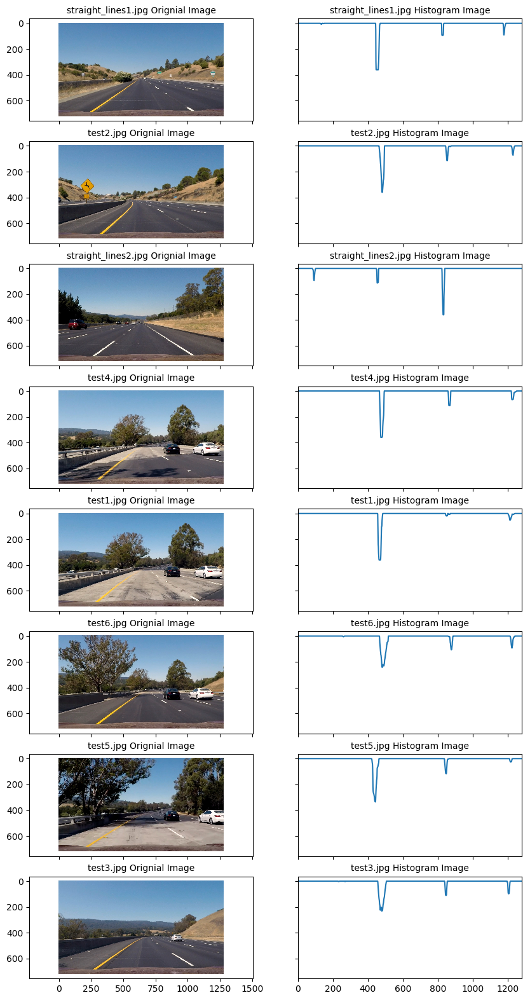

In [39]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
#     img = calibrate_undistort(img)
#     img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Orignial Image' % name, fontsize=10)
    
    img = pipeline(img)
    histogram = find_histogram(img)
 
    axs[i, 1].plot(histogram)
    axs[i, 1].set(xlim=(0, 1280))
    axs[i, 1].set_title('%s Histogram Image' % name, fontsize=10)
    
fig.savefig('../test_images_output/find_histogram.png')

## Next, I'll define a sliding window polyfit

Funtinon:
1. find_lane_pixels: To find the window boundaries, find all pixels within those boundaries, and if there are more than minpix, slide the window over to the mean of these pixels.
2. fit_polynomial: To fit polynomial to binary image with lines extracted, using sliding window

In [ ]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 10
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img

## Next, I'll define a sliding window polyfit

Funtinon:
1. find_lane_pixels: To find the window boundaries, find all pixels within those boundaries, and if there are more than minpix, slide the window over to the mean of these pixels.
2. fit_polynomial: To fit polynomial to binary image with lines extracted, using sliding window

In [101]:
# def hist(img):
#     # Grab only the bottom half of the image
#     # Lane lines are likely to be mostly vertical nearest to the car
#     bottom_half = img[img.shape[0]//2:,:]

#     # Sum across image pixels vertically - make sure to set an `axis`
#     # i.e. the highest areas of vertical lines should be larger values
#     histogram = np.sum(bottom_half, axis=0)
    
#     return histogram


def find_histogram(binary_warped):
#     img = mpimg.imread('warped_example.jpg')/255
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    print (histogram.shape)
#     histogram = np.expand_dims(histogram, axis=0)
#     print (histogram.shape)

#     ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#     plt.plot(histogram, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.xlim(0, 1280)
#     return ploty
#     return plt.hist(histogram, bins=100)
    return histogram
    

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 10
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img

### Run fit_polynomial on test images (path: ../test_images/):

(1280,)
(1280,)
(1280,)
(1280,)
(1280,)
(1280,)
(1280,)
(1280,)


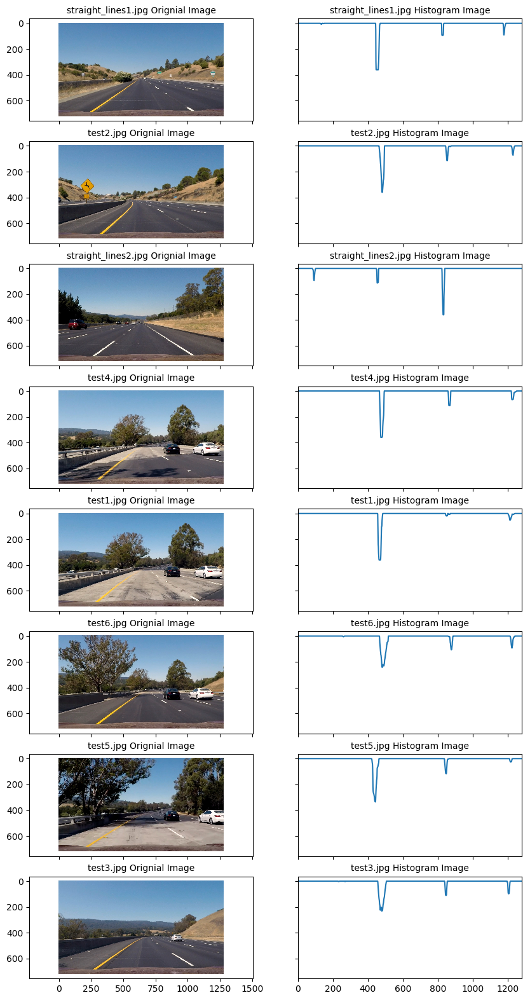

In [105]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
#     img = calibrate_undistort(img)
#     img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Orignial Image' % name, fontsize=10)
    
    img = pipeline(img)
    histogram = find_histogram(img)
#     hist = hist(img)
#     plt.plot(img)
#     img = fit_polynomial(img)

#     axs[i, 1].set_xlabel([0,1280])
#     axs[i, 1].hist(lum_img.ravel(), bins=256, range=(0), fc='k', ec='k')
#     axs[i, 1].imshow(img, cmap=plt.cm.Reds, interpolation='none', extent=[0,1280,0,255])
#     axs[i, 1].set_xlim(0,1280)
#     axs[i, 1].imshow(img, cmap='gray')
    axs[i, 1].plot(histogram)
    axs[i, 1].set(xlim=(0, 1280))
#     axs[i, 1].hist(img, bins=256, range=(0, 1280), fc='k', ec='k')
    axs[i, 1].set_title('%s Histogram Image' % name, fontsize=10)
    
#     axs[i, 1].imshow(img, cmap='gray')
#     axs[i, 1].set_title('%s Pipeline Image' % name, fontsize=10)
    
# fig.savefig('../test_images_output/fit_polynomial.png')

## Sliding Window Polyfit

In [27]:
# Define method to fit polynomial to binary image with lines extracted, using sliding window
def sliding_window_polyfit(img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
    # Previously the left/right base was the max of the left/right half of the histogram
    # this changes it so that only a quarter of the histogram (directly to the left/right) is considered
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    
    #print('base pts:', leftx_base, rightx_base)

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    visualization_data = (rectangle_data, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data
print('...')

...


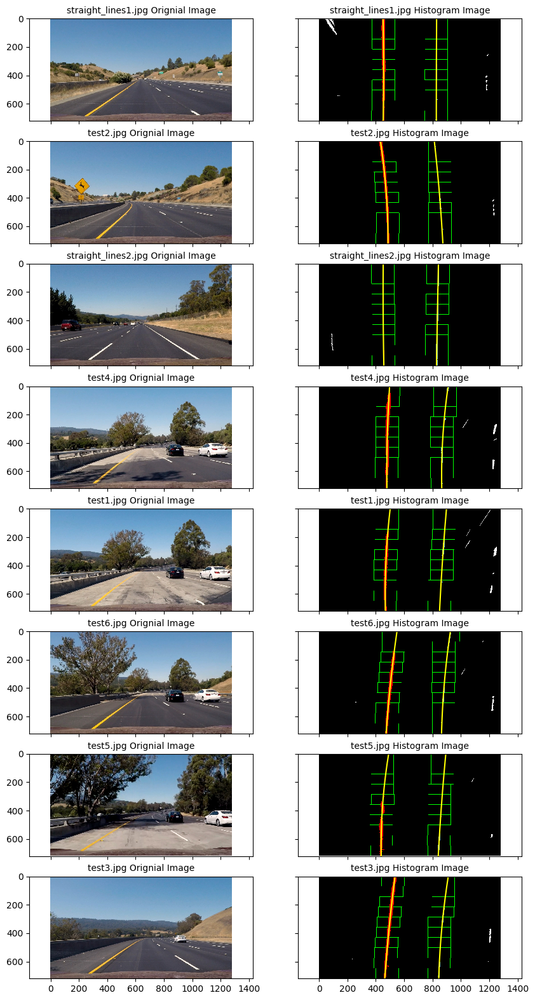

In [34]:
# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

row = 8
column = 2
fig, axs = plt.subplots(row, column, figsize=(10,20), dpi=100, sharex='col', sharey='row')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
#     print (i, fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    name = fname.replace("../test_images/", "")
    
    
#     img = calibrate_undistort(img)
#     img = unwarp(img)
    
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('%s Orignial Image' % name, fontsize=10)
    
    img = pipeline(img)
    
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window_polyfit(img)

    h = img.shape[0]
    left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
    #print('fit x-intercepts:', left_fit_x_int, right_fit_x_int)

    rectangles = visualization_data[0]
    histogram = visualization_data[1]
    
    # Create an output image to draw on and  visualize the result
    out_img = np.uint8(np.dstack((img, img, img))*255)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    for rect in rectangles:
    # Draw the windows on the visualization image
        cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
        cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]
    
#     plt.imshow(out_img)
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.xlim(0, 1280)
#     plt.ylim(720, 0)
    
    axs[i, 1].imshow(out_img)
    axs[i, 1].plot(left_fitx, ploty, color='yellow')
    axs[i, 1].plot(right_fitx, ploty, color='yellow')
    axs[i, 1].set(xlim=(0, 1280))
    axs[i, 1].set(ylim=(720, 0))
#     axs[i, 1].hist(img, bins=256, range=(0, 1280), fc='k', ec='k')
    axs[i, 1].set_title('%s Histogram Image' % name, fontsize=10)
    
    
#     img = sliding_window_polyfit(img)
#     axs[i, 1].imshow(img, cmap='gray')
#     axs[i, 1].set_title('%s Pipeline Image' % name, fontsize=10)
    
    
fig.savefig('../test_images_output/sliding_window_polyfit.png')

...


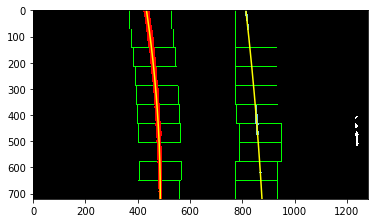

In [78]:
# visualize the result on example image
exampleImg = cv2.imread('../test_images/test2.jpg')
exampleImg = cv2.cvtColor(exampleImg, cv2.COLOR_BGR2RGB)
exampleImg_bin, Minv = pipeline(exampleImg)
    
left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window_polyfit(exampleImg_bin)

h = exampleImg.shape[0]
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
#print('fit x-intercepts:', left_fit_x_int, right_fit_x_int)

rectangles = visualization_data[0]
histogram = visualization_data[1]

# Create an output image to draw on and  visualize the result
out_img = np.uint8(np.dstack((exampleImg_bin, exampleImg_bin, exampleImg_bin))*255)
# Generate x and y values for plotting
ploty = np.linspace(0, exampleImg_bin.shape[0]-1, exampleImg_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
for rect in rectangles:
# Draw the windows on the visualization image
    cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
    cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
# Identify the x and y positions of all nonzero pixels in the image
nonzero = exampleImg_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

print('...')

...


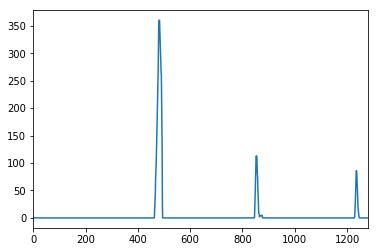

In [79]:
# Print histogram from sliding window polyfit for example image
plt.plot(histogram)
plt.xlim(0, 1280)
print('...')

In [ ]:
## Polyfit Using Fit from Previous Frame

In [80]:
# Define method to fit polynomial to binary image based upon a previous fit (chronologically speaking);
# this assumes that the fit will not change significantly from one video frame to the next
def polyfit_using_prev_fit(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds
print('...')

...


...


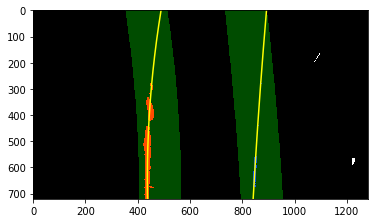

In [82]:
# visualize the result on example image
exampleImg2 = cv2.imread('../test_images/test5.jpg')
exampleImg2 = cv2.cvtColor(exampleImg2, cv2.COLOR_BGR2RGB)
exampleImg2_bin, Minv = pipeline(exampleImg2)   
margin = 80

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_using_prev_fit(exampleImg2_bin, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, exampleImg2_bin.shape[0]-1, exampleImg2_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((exampleImg2_bin, exampleImg2_bin, exampleImg2_bin))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = exampleImg2_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area (OLD FIT)
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
print('...')

In [ ]:
## Radius of Curvature and Distance from Lane Center Calculation

In [83]:
# Method to determine radius of curvature and distance from lane center 
# based on binary image, polynomial fit, and L and R lane pixel indices
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist
print('...')

...


In [84]:
rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(exampleImg_bin, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')

Radius of curvature for example: 454.42482138 m, 1260.24345845 m
Distance from lane center for example: -0.398647820288 m


## Draw the Detected Lane Back onto the Original Image

In [85]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result
print('...')

...


...


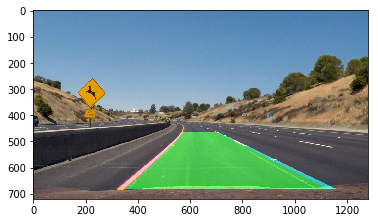

In [86]:
exampleImg_out1 = draw_lane(exampleImg, exampleImg_bin, left_fit, right_fit, Minv)
plt.imshow(exampleImg_out1)
print('...')

## Draw Curvature Radius and Distance from Center Data onto the Original Image

In [87]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img
print('...')

...


...


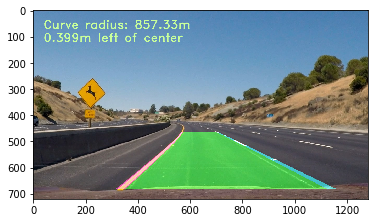

In [88]:
exampleImg_out2 = draw_data(exampleImg_out1, (rad_l+rad_r)/2, d_center)
plt.imshow(exampleImg_out2)
print('...')

## Define a Line Class for Storing Data

In [89]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)


            

print('...')

...


## Define Complete Image Processing Pipeline

In [90]:
def process_image(img):
    new_img = np.copy(img)
    img_bin, Minv = pipeline(new_img)
    
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window_polyfit(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_using_prev_fit(img_bin, l_line.best_fit, r_line.best_fit)
        
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit, Minv)
        rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(img_bin, l_line.best_fit, r_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        img_out = draw_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
    
    diagnostic_output = False
    if diagnostic_output:
        # put together multi-view output
        diag_img = np.zeros((720,1280,3), dtype=np.uint8)
        
        # original output (top left)
        diag_img[0:360,0:640,:] = cv2.resize(img_out,(640,360))
        
        # binary overhead view (top right)
        img_bin = np.dstack((img_bin*255, img_bin*255, img_bin*255))
        resized_img_bin = cv2.resize(img_bin,(640,360))
        diag_img[0:360,640:1280, :] = resized_img_bin
        
        # overhead with all fits added (bottom right)
        img_bin_fit = np.copy(img_bin)
        for i, fit in enumerate(l_line.current_fit):
            img_bin_fit = plot_fit_onto_img(img_bin_fit, fit, (20*i+100,0,20*i+100))
        for i, fit in enumerate(r_line.current_fit):
            img_bin_fit = plot_fit_onto_img(img_bin_fit, fit, (0,20*i+100,20*i+100))
        img_bin_fit = plot_fit_onto_img(img_bin_fit, l_line.best_fit, (255,255,0))
        img_bin_fit = plot_fit_onto_img(img_bin_fit, r_line.best_fit, (255,255,0))
        diag_img[360:720,640:1280,:] = cv2.resize(img_bin_fit,(640,360))
        
        # diagnostic data (bottom left)
        color_ok = (200,255,155)
        color_bad = (255,155,155)
        font = cv2.FONT_HERSHEY_DUPLEX
        if l_fit is not None:
            text = 'This fit L: ' + ' {:0.6f}'.format(l_fit[0]) + \
                                    ' {:0.6f}'.format(l_fit[1]) + \
                                    ' {:0.6f}'.format(l_fit[2])
        else:
            text = 'This fit L: None'
        cv2.putText(diag_img, text, (40,380), font, .5, color_ok, 1, cv2.LINE_AA)
        if r_fit is not None:
            text = 'This fit R: ' + ' {:0.6f}'.format(r_fit[0]) + \
                                    ' {:0.6f}'.format(r_fit[1]) + \
                                    ' {:0.6f}'.format(r_fit[2])
        else:
            text = 'This fit R: None'
        cv2.putText(diag_img, text, (40,400), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Best fit L: ' + ' {:0.6f}'.format(l_line.best_fit[0]) + \
                                ' {:0.6f}'.format(l_line.best_fit[1]) + \
                                ' {:0.6f}'.format(l_line.best_fit[2])
        cv2.putText(diag_img, text, (40,440), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Best fit R: ' + ' {:0.6f}'.format(r_line.best_fit[0]) + \
                                ' {:0.6f}'.format(r_line.best_fit[1]) + \
                                ' {:0.6f}'.format(r_line.best_fit[2])
        cv2.putText(diag_img, text, (40,460), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Diffs L: ' + ' {:0.6f}'.format(l_line.diffs[0]) + \
                             ' {:0.6f}'.format(l_line.diffs[1]) + \
                             ' {:0.6f}'.format(l_line.diffs[2])
        if l_line.diffs[0] > 0.001 or \
           l_line.diffs[1] > 1.0 or \
           l_line.diffs[2] > 100.:
            diffs_color = color_bad
        else:
            diffs_color = color_ok
        cv2.putText(diag_img, text, (40,500), font, .5, diffs_color, 1, cv2.LINE_AA)
        text = 'Diffs R: ' + ' {:0.6f}'.format(r_line.diffs[0]) + \
                             ' {:0.6f}'.format(r_line.diffs[1]) + \
                             ' {:0.6f}'.format(r_line.diffs[2])
        if r_line.diffs[0] > 0.001 or \
           r_line.diffs[1] > 1.0 or \
           r_line.diffs[2] > 100.:
            diffs_color = color_bad
        else:
            diffs_color = color_ok
        cv2.putText(diag_img, text, (40,520), font, .5, diffs_color, 1, cv2.LINE_AA)
        text = 'Good fit count L:' + str(len(l_line.current_fit))
        cv2.putText(diag_img, text, (40,560), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Good fit count R:' + str(len(r_line.current_fit))
        cv2.putText(diag_img, text, (40,580), font, .5, color_ok, 1, cv2.LINE_AA)
        
        img_out = diag_img
    return img_out
print('...')

...


In [91]:
def plot_fit_onto_img(img, fit, plot_color):
    if fit is None:
        return img
    new_img = np.copy(img)
    h = new_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    plotx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
    pts = np.array([np.transpose(np.vstack([plotx, ploty]))])
    cv2.polylines(new_img, np.int32([pts]), isClosed=False, color=plot_color, thickness=8)
    return new_img
print('...')

...


In [ ]:
## Process Project Video

In [92]:
l_line = Line()
r_line = Line()
#my_clip.write_gif('test.gif', fps=12)
video_output1 = '../project_video_output.mp4'
video_input1 = VideoFileClip('../project_video.mp4')#.subclip(22,26)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video ../project_video_output.mp4
[MoviePy] Writing video ../project_video_output.mp4


100%|█████████▉| 1260/1261 [04:13<00:00,  5.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../project_video_output.mp4 

CPU times: user 2min 8s, sys: 3.1 s, total: 2min 11s
Wall time: 4min 17s


In [93]:
l_line = Line()
r_line = Line()
video_output2 = '../challenge_video_output.mp4'
video_input2 = VideoFileClip('../challenge_video.mp4')#.subclip(10,12)
#video_input2.save_frame("challenge01.jpeg", t=0.25) # saves the frame at time = 0.25s
processed_video = video_input2.fl_image(process_image)
%time processed_video.write_videofile(video_output2, audio=False)

[MoviePy] >>>> Building video ../challenge_video_output.mp4
[MoviePy] Writing video ../challenge_video_output.mp4


100%|██████████| 485/485 [01:30<00:00,  5.10it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../challenge_video_output.mp4 

CPU times: user 45.9 s, sys: 1.06 s, total: 47 s
Wall time: 1min 33s


In [94]:
l_line = Line()
r_line = Line()
video_output3 = '../harder_challenge_video_output.mp4'
video_input3 = VideoFileClip('../harder_challenge_video.mp4')#.subclip(0,3)
#video_input3.save_frame("hard_challenge01.jpeg") # saves the first frame
processed_video = video_input3.fl_image(process_image)
%time processed_video.write_videofile(video_output3, audio=False)

[MoviePy] >>>> Building video ../harder_challenge_video_output.mp4
[MoviePy] Writing video ../harder_challenge_video_output.mp4


 59%|█████▊    | 704/1200 [02:50<01:54,  4.33it/s]

ValueError: On entry to DLASCL parameter number 4 had an illegal value